<h1><font color="#0A4E97"><b><center>Assignment -1 Fraud Analytics</center><br></b></h1></font>

### Aim: 
* To conduct descriptive and Predictive analytics on 2 given data sets. 
* Display comprehensive understanding of dataset and results of both analysis. 

<hr style="height:4px;border-width:0;color:#8EBAD9;background-color:#8EBAD9">  
<h1><font color="#0A4E97"><b><center> Dataset 1: Credit-Card Fraud Detection </center><br></b></h1></font>

### Datset Overview:

* The dataset contains transactions made by credit cards in September 2013 by European cardholders.
* This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.
* It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, we cannot provide the original features and more background information about the data. Features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import norm
import plotly.express as px
from scipy.stats import shapiro
import warnings
from sklearn.decomposition import PCA
warnings.filterwarnings("ignore")
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from math import ceil, floor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, roc_curve, auc
import time
from plotly.subplots import make_subplots
from matplotlib.gridspec import GridSpec
from IPython.display import display, Markdown, HTML
from sklearn.preprocessing import LabelEncoder

In [2]:
data = pd.read_csv(r"C:\Users\krtej\Jupyter_folder\Fraud\Dataset\Credit_Card-Fraud-Detection-Dataset\creditcard.csv")

In [3]:
data 

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


<h2><font color="#0A4E97"><b>1. Exploratory Data Analysis <br></b></h2></font>

<h3><font color="#0A4E97"><b>Null Values and Data types <br></b></h3></font>

In [4]:
data.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

#### Null Count:

* No Null values across any columns 

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

<h3><font color="#0A4E97"><b>Descriptive Analytics <br></b></h3></font>

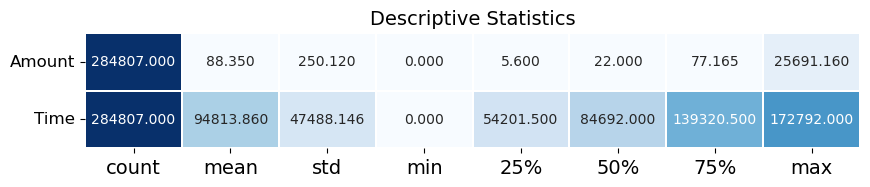

In [6]:
# statistical summary:
cols =data[["Amount","Time"]]
cmap1 = 'Blues'
def desc_stats(dataframe):
    desc = dataframe.describe().T
    f,ax = plt.subplots(figsize=(10,
                                 desc.shape[0] * 0.75))
    sns.heatmap(desc,
                annot = True,
                cmap = cmap1,
                fmt= '.3f',
                ax = ax,
                linecolor = 'white',
                linewidths = 1.3,
                cbar = False,
                annot_kws = {"size": 10})
    plt.xticks(size = 14)
    plt.yticks(size = 12,
               rotation = 0)
    plt.title("Descriptive Statistics", size = 14)
    plt.show()
    
desc_stats(cols)

### Results:
**Amount**
- Mean amount of transaction was : 88.35
-  Maximum Transaction was of : 25691.16

**Time**
- Last Transaction occured 172792 seconds after the first transaction as per datset meaning we are having transactional data of nearly 48 hours
- 50% of transactions occured in first 15 hours after the transaction. 
- This indicates transactions varied in frequency with time and is needed to be analysed further

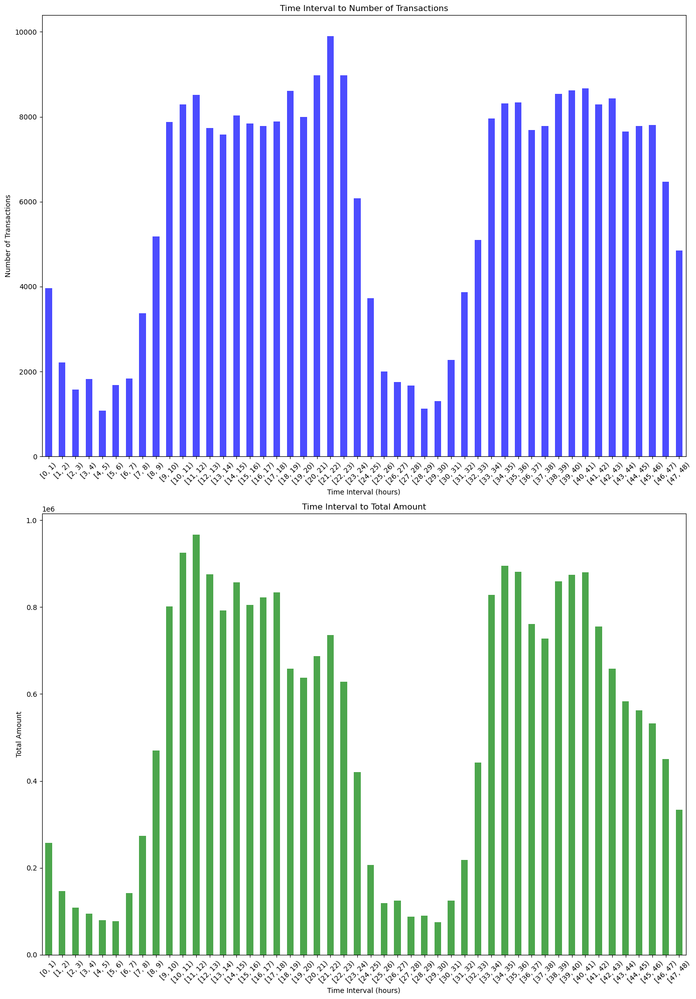

In [7]:
def create_hourly_intervals(data):
    # Create a copy of the original data
    df = data.copy()
    
    # Convert 'Time' to hours
    df['Time'] = df['Time'] / 3600
    
    # Group data by hourly intervals
    hourly_data = df.groupby(pd.cut(df['Time'], bins=range(0, int(df['Time'].max())+2), right=False)).agg({
        'Time': 'count',
        'Amount': 'sum'
    }).rename(columns={'Time': 'Transaction Count', 'Amount': 'Total Amount'})
    
    return hourly_data

# Create hourly intervals and calculate metrics
hourly_data = create_hourly_intervals(data.copy())

# Create plots
plt.figure(figsize=(14, 20))

# Plot 1: Time to Number of Transactions
plt.subplot(2, 1, 1)
hourly_data['Transaction Count'].plot(kind='bar', color='blue', alpha=0.7)
plt.title('Time Interval to Number of Transactions')
plt.xlabel('Time Interval (hours)')
plt.ylabel('Number of Transactions')
plt.xticks(rotation=45)

# Plot 2: Time to Total Amount
plt.subplot(2, 1, 2)
hourly_data['Total Amount'].plot(kind='bar', color='green', alpha=0.7)
plt.title('Time Interval to Total Amount')
plt.xlabel('Time Interval (hours)')
plt.ylabel('Total Amount')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#### Conclusion :

* Two peaks indicating that higher amount of transactions take place during 17:00 to 23:00 hrs(if we consider start point as 00:00 hrs)
* Despite lower transactions on early hours the amount being transfered in duration 8:00-12:00 hrs is relatively high indicatinhg that average trsansaction amount is higher than usual in that duration 

<h3><font color="#0A4E97"><b>Correlation <br></b></h3></font>

In [8]:
# correlation matrix
corr = data.corr()
corr.style.background_gradient(cmap='GnBu')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.117396,-0.010593,-0.419618,-0.105260,0.173072,-0.063016,0.084714,-0.036949,-0.008660,0.030617,-0.247689,0.124348,-0.065902,-0.098757,-0.183453,0.011903,-0.073297,0.090438,0.028975,-0.050866,0.044736,0.144059,0.051142,-0.016182,-0.233083,-0.041407,-0.005135,-0.009413,-0.010596,-0.012323
V1,0.117396,1.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.227709,-0.101347
V2,-0.010593,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.531409,0.091289
V3,-0.419618,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.210880,-0.192961
V4,-0.105260,-0.000000,-0.000000,0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.098732,0.133447
V5,0.173072,0.000000,0.000000,-0.000000,-0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.386356,-0.094974
V6,-0.063016,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.215981,-0.043643
V7,0.084714,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.397311,-0.187257
V8,-0.036949,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.103079,0.019875
V9,-0.008660,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.044246,-0.097733


### Conclusion:

* A lot of 0 correlation however it is between the PCA components it is important to understand that PCA are linear combinations of the original features, and they are ordered in a way that the first component captures the most variance in the data, the second captures the second most, and so on thus they will not have any correlations. 

* No other components are having any correlation with orignal features that are Time, Class and Amount

<h3><font color="#0A4E97"><b>Class Imbalance <br></b></h3></font>

In [9]:
# Distribution of Fraud and Normal Transactions

px.pie(data, names="Class", title="Distribution of Fraud and Normal Transactions:(Normal:0 | Fraud:1)", color_discrete_sequence=['#1E90FF', '#FF4500'],
       template="plotly_dark", width=800, height=600)

### Conclusion:
* As indicated in data heading data is highly imbalanced which can be notivced above 

<h3><font color="#0A4E97"><b>Understanding Fraud Transaction Behaviour <br></b></h3></font>

In [10]:
# Calculate average transaction value for each class
class_avg_amount = data.groupby('Class')['Amount'].mean().reset_index()

# Create the bubble plot using Plotly
fig = px.scatter(class_avg_amount, x='Class', y='Amount', size='Amount', color='Class',
                 labels={'Class': 'Class', 'Amount': 'Average Transaction Value'},
                 hover_data=['Amount'],
                 title='Average Transaction Value by Class',
                 template='plotly')

# Set the size range for bubbles
fig.update_traces(marker=dict(sizemode='diameter', sizeref=0.1))
# Show the plot
fig.show()

In [11]:
def plot_fraud_and_non_fraud_count_over_time(data):
    # Calculate fraud and non-fraud count over time
    df = data.copy()
    df['Time'] = df['Time'] / 3600
    
    hourly_counts = df.groupby(pd.cut(df['Time'], bins=range(0, int(df['Time'].max())+2), right=False)).agg({
        'Class': ['sum', 'count']
    })
    
    hourly_counts.columns = hourly_counts.columns.droplevel()
    hourly_counts = hourly_counts.rename(columns={'sum': 'Fraud Count', 'count': 'Total Count'})
    
    # Scale down non-fraud count for visualization
    hourly_counts['Non-Fraud Count'] = hourly_counts['Total Count'] - hourly_counts['Fraud Count']
    hourly_counts['Scaled Non-Fraud Count'] = hourly_counts['Non-Fraud Count'] * 0.1
    
    return hourly_counts

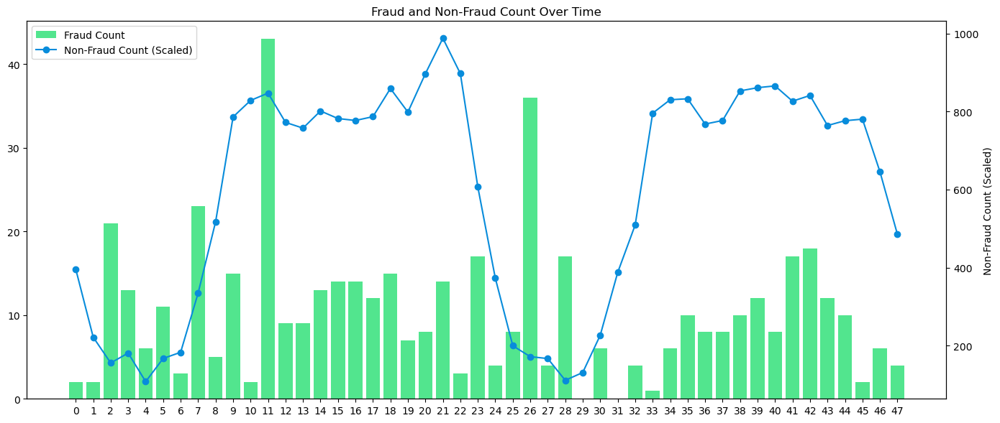

In [12]:
# Calculate fraud and non-fraud counts over time
hourly_counts = plot_fraud_and_non_fraud_count_over_time(data)

# Extract left edges of intervals for x-axis
hourly_hours = [interval.left for interval in hourly_counts.index]

plt.figure(figsize=(14, 6))

# Plot Fraud Count using bars
fraud_bars = plt.bar(hourly_hours, hourly_counts['Fraud Count'], color='#08db5f', alpha=0.7, label='Fraud Count')

# Create a twin Axes sharing the xaxis
ax2 = plt.gca().twinx()

# Plot Scaled Non-Fraud Count using a line
scaled_non_fraud_count = hourly_counts['Scaled Non-Fraud Count']
non_fraud_line, = ax2.plot(hourly_hours, scaled_non_fraud_count, color='#088cdb', marker='o', label='Non-Fraud Count (Scaled)')

plt.title('Fraud and Non-Fraud Count Over Time')
plt.xlabel('Time in Hours')

# Set y-axis labels
plt.ylabel('Fraud Count')
ax2.set_ylabel('Non-Fraud Count (Scaled)')

# Set x-axis ticks for all hours (from 0 to max hour)
max_hour = int(data['Time'].max() / 3600)
plt.xticks(range(max_hour + 1), rotation=45)

# Combine the legends for both axes
plt.legend(handles=[fraud_bars, non_fraud_line], loc='upper left')

plt.tight_layout()
plt.show()

### Conclusion:
* The average amount of fradulent transaction is nearly 40% higher than average transaction
* No typical pattern can be identified while comparing fraudulent and non-fraudulent transactions (Please note the scale is lowered for better understanding)

<h2><font color="#0A4E97"><b>2. Normality Test (Shapiro Wilk Test)<br></b></h2></font>

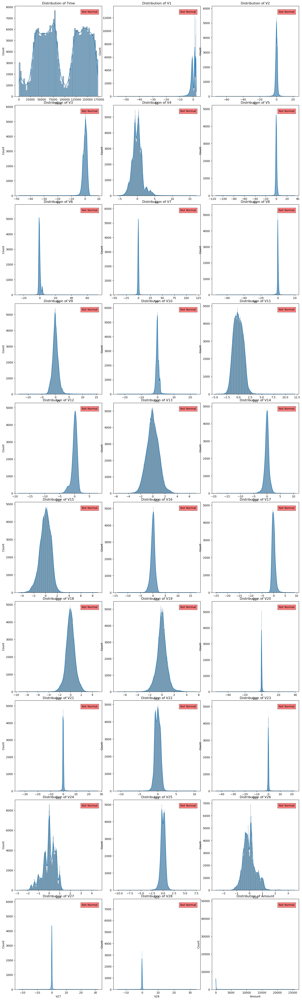

In [13]:
# Create a new DataFrame to store the normality test results
normality_test_results = pd.DataFrame(columns=['Column', 'p-value'])

# Create subplots
num_columns = len(data.columns) - 1  # Exclude the last column
num_rows = int(np.ceil(num_columns / 3))
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
fig.tight_layout()

# Loop through each column and perform Shapiro-Wilk test
for i, column in enumerate(data.columns[:-1]):  # Exclude the last column
    variable = data[column]
    statistic, p_value = shapiro(variable)
    normality_test_results = normality_test_results.append({'Column': column, 'p-value': p_value}, ignore_index=True)
    
    # Create a distribution plot
    ax = axes[i // 3, i % 3]
    sns.histplot(variable, ax=ax, kde=True)
    ax.set_title(f'Distribution of {column}')
    
    # Highlight normal distributions
    if p_value >= 0.05:
        ax.text(0.95, 0.95, 'Normal', transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='green', alpha=0.5))
    else:
        ax.text(0.95, 0.95, 'Not Normal', transform=ax.transAxes, fontsize=10,
                verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='red', alpha=0.5))

# Remove empty subplots
if num_columns % 3 != 0:
    for i in range(num_columns % 3, 3):
        fig.delaxes(axes[num_rows - 1, i])

# Show the plots
plt.show()

### Conclusion 
* None of the Variables are having normal distribution as per shapiro Wilk Test 

<h2><font color="#0A4E97"><b>3. PCA Visualization from N-D to 2-D and 3-D<br></b></h2></font>

Commenting these to make an Urgent Git push 

In [14]:
# X = data.drop('Class', axis=1)

# # Apply PCA with n_components=2
# pca = PCA(n_components=2)
# principal_components_2d = pca.fit_transform(X)

# # Create a DataFrame for 2D principal components
# pca_df_2d = pd.DataFrame(data=principal_components_2d, columns=['PC1', 'PC2'])

# # Add the 'Class' column back to the DataFrame
# pca_df_2d['Class'] = data['Class']

# # Create a scatter plot using Plotly for 2D PCA
# fig_2d = px.scatter(pca_df_2d, x='PC1', y='PC2', color='Class', title='PCA 2D Visualization')
# fig_2d.show()

In [15]:
# X = data.drop('Class', axis=1)

# # Apply PCA with n_components=3
# pca = PCA(n_components=3)
# principal_components_3d = pca.fit_transform(X)

# # Create a DataFrame for 3D principal components
# pca_df_3d = pd.DataFrame(data=principal_components_3d, columns=['PC1', 'PC2', 'PC3'])

# # Add the 'Class' column back to the DataFrame
# pca_df_3d['Class'] = data['Class']

# # Convert class labels to strings
# pca_df_3d['Class'] = pca_df_3d['Class'].astype(str)

# # Create a 3D scatter plot using Plotly for 3D PCA
# fig_3d = go.Figure()

# # Add scatter trace for each class
# for class_label in pca_df_3d['Class'].unique():
#     class_data = pca_df_3d[pca_df_3d['Class'] == class_label]
#     fig_3d.add_trace(go.Scatter3d(
#         x=class_data['PC1'], y=class_data['PC2'], z=class_data['PC3'],
#         mode='markers', marker=dict(size=5), name=class_label
#     ))

# # Set layout for the 3D plot
# fig_3d.update_layout(
#     scene=dict(
#         xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'
#     ),
#     title='PCA 3D Visualization'
# )

# # Show the 3D scatter plot
# fig_3d.show()


In [16]:
# loadings = pca.components_
# # Create a DataFrame to show the loadings for each original variable on each principal component
# loadings_df = pd.DataFrame(loadings, columns=X.columns, index=['PC1', 'PC2', 'PC3'])

In [ ]:
loadings_df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
PC1,-1.000000,-0.000005,3.683571e-07,0.000013,0.000003,-0.000005,0.000002,-0.000002,9.292978e-07,2.003577e-07,...,8.257632e-07,-6.919504e-07,-0.000002,-6.725130e-07,2.063779e-07,0.000003,4.204759e-07,4.364229e-08,6.542626e-08,0.000056
PC2,0.000056,-0.001774,-3.509530e-03,-0.001305,0.000553,-0.002122,0.001147,0.001970,-4.941297e-04,-1.947654e-04,...,1.044536e-03,3.127018e-04,-0.000184,-2.798711e-04,1.204686e-05,-0.000105,-7.031514e-06,4.643273e-05,1.340707e-05,0.999985
PC3,0.000004,-0.977405,1.781261e-01,-0.031752,-0.031460,0.082471,-0.037914,-0.037694,8.845853e-03,2.474736e-03,...,-1.855747e-02,-2.982130e-03,0.008564,5.883646e-03,-7.122428e-04,-0.004551,-8.876776e-04,-7.557673e-04,-3.349921e-04,-0.000805


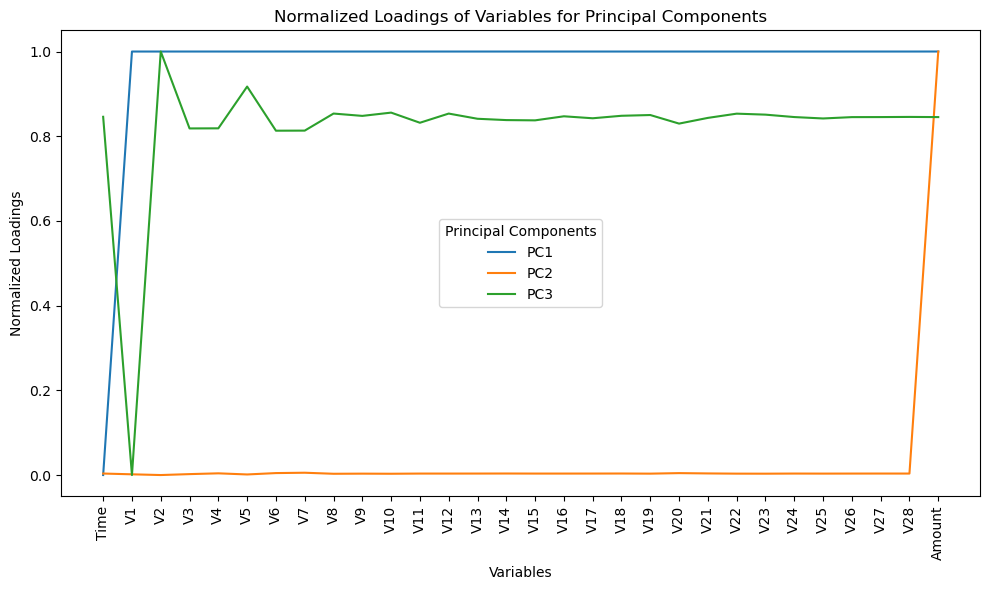

In [ ]:
# Normalize the loadings
scaler = MinMaxScaler()
normalized_loadings = scaler.fit_transform(loadings_df.T)

# Create a DataFrame for normalized loadings
normalized_loadings_df = pd.DataFrame(normalized_loadings, columns=loadings_df.index, index=loadings_df.columns)

# Plot normalized loadings using a line plot
plt.figure(figsize=(10, 6))
for pc in normalized_loadings_df.columns:
    plt.plot(normalized_loadings_df.index, normalized_loadings_df[pc], label=pc)

plt.title('Normalized Loadings of Variables for Principal Components')
plt.xlabel('Variables')
plt.ylabel('Normalized Loadings')
plt.legend(title='Principal Components')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Interpretation 
* Of created 3 components PC1 gives constant weight to all independent variable except time, while PC2 considers Time and excludes variable V1 while also giving certain weights to all other variable however it cannot be considered constant while PC3 can be considered to only value Amount variable
* After looking at the 3d Plot for class 1 it can be concluded that components PC1 and PC3 are playing key role in determining the fraudulent transaction thus indicating the amount may not be an important factor

<h2><font color="#0A4E97"><b>4. Feature Reduction<br></b></h2></font>

<h3><font color="#0A4E97"><b>Variance Cutt-off <br></b></h3></font>

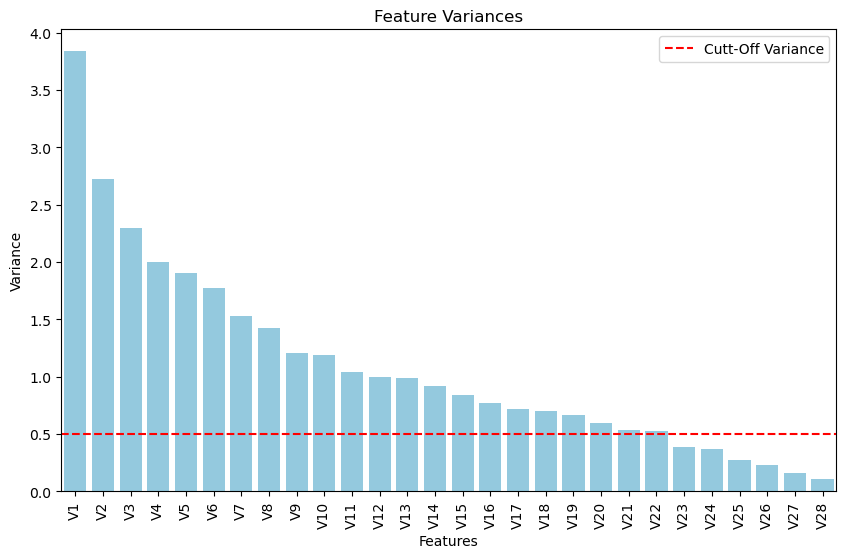

In [ ]:
features = data.drop(['Time','Class', 'Amount'], axis=1)  # Dependent variable and orignal variable

# Calculate the variances of the normalized data
variances = features.var()

# Create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=variances.index, y=variances.values, color='skyblue')
plt.xticks(rotation=90)
plt.axhline(y=0.5, color='red', linestyle='dashed', label='Cutt-Off Variance')
plt.legend()
plt.title('Feature Variances')
plt.xlabel('Features')
plt.ylabel('Variance')
plt.show()

#####  <center>Variables V22 - V28 will be dropped since they do not qualify the cutoff variance level </center> 

In [ ]:
df = data

In [ ]:
data_reduced = df.drop(['V22','V23', 'V24', 'V25', 'V26', 'V27', 'V27', 'V28'], axis= 1)

In [ ]:
data_reduced

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V14,V15,V16,V17,V18,V19,V20,V21,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,4.626942,-0.924459,1.107641,1.991691,0.510632,-0.682920,1.475829,0.213454,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,-0.675143,1.164931,-0.711757,-0.025693,-1.221179,-1.545556,0.059616,0.214205,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,-0.510602,1.329284,0.140716,0.313502,0.395652,-0.577252,0.001396,0.232045,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.449624,1.962563,-0.608577,0.509928,1.113981,2.897849,0.127434,0.265245,10.00,0


<h3><font color="#0A4E97"><b>Univariate ROC<br></b></h3></font>

In [ ]:
def calculate_roc_scores(data, target_column):
    # Split data into features (X) and target (y)
    X = data.drop(target_column, axis=1)
    y = data[target_column]
    
    # Create an empty dictionary to store ROC scores
    roc_scores = {}
    
    # Iterate over each feature
    for feature in X.columns:
        # Select the current feature as input
        X_feature = X[[feature]]
        
        # Split data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X_feature, y, test_size=0.2, random_state=42)
        
        # Train a logistic regression classifier
        clf = LogisticRegression()
        clf.fit(X_train, y_train)
        
        # Predict probabilities for the test set
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        
        # Calculate ROC AUC score
        roc_score = roc_auc_score(y_test, y_pred_prob)
        
        # Store the ROC score in the dictionary
        roc_scores[feature] = roc_score
    
    # Create a DataFrame from the dictionary
    roc_df = pd.DataFrame.from_dict(roc_scores, orient='index', columns=['ROC AUC Score'])
    return roc_df

In [ ]:
roc_scores_df = calculate_roc_scores(data_reduced, target_column='Class')

In [ ]:
roc_scores_df

,ROC AUC Score
Time,0.550391
V1,0.835093
V2,0.822065
V3,0.913510
V4,0.933514
V5,0.753779
V6,0.745018
V7,0.803683
V8,0.639397
V9,0.845717


In [ ]:
def plot_roc_curves_subplots(data, target_column):
    # Calculate ROC scores using the calculate_roc_scores function
    roc_scores_df = calculate_roc_scores(data, target_column)
    
    # Determine the number of subplots
    num_features = len(roc_scores_df)
    num_cols = 3
    num_rows = int(np.ceil(num_features / num_cols)) - 1
    
    # Create subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    
    # Flatten the axes array if necessary
    axes = axes.flatten() if isinstance(axes, np.ndarray) else [axes]
    
    # Iterate over each feature and subplot
    for i, (feature, ax) in enumerate(zip(roc_scores_df.index, axes)):
        if i < num_features: 
            X_feature = data[[feature]]
            y = data[target_column]
            X_train, X_test, y_train, y_test = train_test_split(X_feature, y, test_size=0.2, random_state=42)
            clf = LogisticRegression()
            clf.fit(X_train, y_train)
            y_pred_prob = clf.predict_proba(X_test)[:, 1]
            fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
            roc_score = auc(fpr, tpr)
            
            ax.plot(fpr, tpr, label=f'AUC = {roc_score:.2f}')
            ax.plot([0, 1], [0, 1], 'k--')
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f'ROC Curve for {feature}')
            ax.legend(loc='lower right')
    
    # Adjust layout and show the subplots
    plt.tight_layout()
    plt.show()

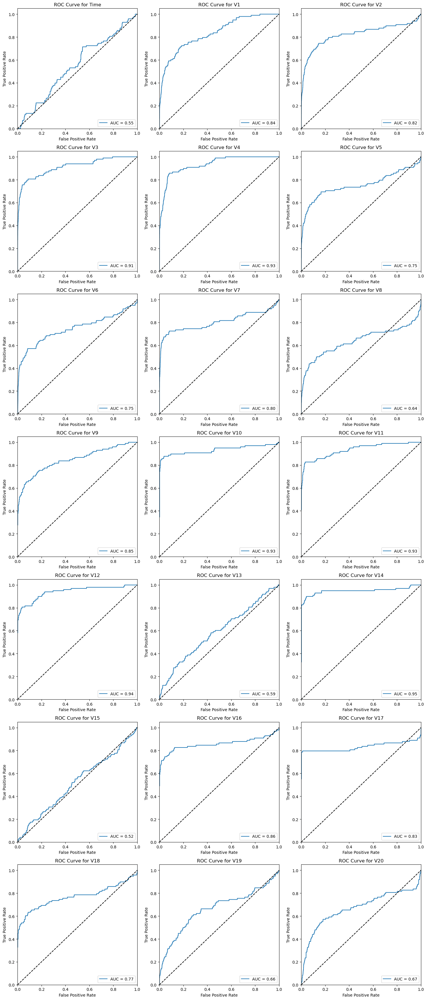

In [ ]:
# Call the plot_roc_curves_subplots function to plot ROC curves for each feature
plot_roc_curves_subplots(data_reduced, target_column='Class')

##### These ROC AUC curve are created after considering only one variable for linear regression based on it 'V13', 'V15', 'V22', 'V23', 'V24', 'V25', 'V26' will be removed as they are lower then threshold value of 0.7 

In [ ]:
val = roc_scores_df[roc_scores_df['ROC AUC Score'] < 0.7].index.tolist()

In [ ]:
val.remove('Time')
val.remove('Amount')
val

['V8', 'V13', 'V15', 'V19', 'V20']

In [ ]:
data_reduced.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'Amount', 'Class'],
      dtype='object')

In [ ]:
data_reduced.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'Amount', 'Class'],
      dtype='object')

In [ ]:
data_reduced = data_reduced.drop(val, axis= 1)

In [ ]:
data_reduced

,Time,V1,V2,V3,V4,V5,V6,V7,V9,V10,V11,V12,V14,V16,V17,V18,V21,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.363787,0.090794,-0.551600,-0.617801,-0.311169,-0.470401,0.207971,0.025791,-0.018307,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,-0.255425,-0.166974,1.612727,1.065235,-0.143772,0.463917,-0.114805,-0.183361,-0.225775,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,-1.514654,0.207643,0.624501,0.066084,-0.165946,-2.890083,1.109969,-0.121359,0.247998,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,-1.387024,-0.054952,-0.226487,0.178228,-0.287924,-1.059647,-0.684093,1.965775,-0.108300,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,0.817739,0.753074,-0.822843,0.538196,-1.119670,-0.451449,-0.237033,-0.038195,-0.009431,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,1.914428,4.356170,-1.593105,2.711941,4.626942,1.107641,1.991691,0.510632,0.213454,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.584800,-0.975926,-0.150189,0.915802,-0.675143,-0.711757,-0.025693,-1.221179,0.214205,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.432454,-0.484782,0.411614,0.063119,-0.510602,0.140716,0.313502,0.395652,0.232045,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.392087,-0.399126,-1.933849,-0.962886,0.449624,-0.608577,0.509928,1.113981,0.265245,10.00,0


#### Conclusion - 12 Columns or features were reduced thereby reducing model Complexity 

<h2><font color="#0A4E97"><b>5. Model Implementation<br></b></h2></font>

<h3><font color="#0A4E97"><b>Non reduced Data<br></b></h3></font>

#### Train-Test-Split 

In [ ]:
X=data.drop(["Class"],axis=1)
y=data["Class"]

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#### Standardization of data

In [ ]:

sc=StandardScaler()

X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

#### Model Calling 

In [ ]:
knn=KNeighborsClassifier()
svc=SVC()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
gbc=GradientBoostingClassifier()
abc=AdaBoostClassifier()
lr=LogisticRegression()

models = [knn, svc, dtc, rfc, gbc, abc, lr]

In [ ]:
def evaluate_models(models, X_train, y_train, X_test, y_test):
    # Create an empty DataFrame to store the metrics
    model_metrics_df = pd.DataFrame(columns=['Model', 'Accuracy', 'ROC AUC', 'Precision', 'Recall', 'Time', 'FPR', 'TPR'])

    for model in models:
        start_time = time.time()
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        end_time = time.time()

        accuracy = accuracy_score(y_test, y_pred)
        roc_auc = roc_auc_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        elapsed_time = (end_time - start_time)*100

        # Calculate ROC curve
        fpr_auc, tpr_auc, _ = roc_curve(y_test, y_pred)
        
        #Confusion Matrix
        confusion_matrix = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
        tn = confusion_matrix.iloc[0, 0]
        fp = confusion_matrix.iloc[0, 1]
        fn = confusion_matrix.iloc[1, 0]
        tp = confusion_matrix.iloc[1, 1]
        tnr = tn / (tn + fp)
        fnr = fn / (fn + tp)
        tpr = tp / (tp + fn) 
        fpr = fp / (fp + tn)

        # Append the metrics and ROC curve data to the DataFrame
        model_metrics_df = model_metrics_df.append({
            'Model': type(model).__name__,
            'Accuracy': accuracy,
            'ROC AUC': roc_auc,
            'Precision': precision,
            'Recall': recall,
            'Time': elapsed_time,
            'FPR_AUC': fpr_auc,
            'TPR_AUC': tpr_auc,
            'TPR': tpr,
            'FPR': fpr,
            'TNR': tnr,
            'FNR': fnr
        }, ignore_index=True)

    return model_metrics_df

In [ ]:
model_metrics = evaluate_models(models, X_train, y_train, X_test, y_test)

In [ ]:
model_metrics

,Model,Accuracy,ROC AUC,Precision,Recall,Time,FPR,TPR,FNR,FPR_AUC,TNR,TPR_AUC
0,KNeighborsClassifier,0.999526,0.887711,0.938272,0.775510,1506.722498,0.000088,0.775510,0.224490,"[0.0, 8.792909397861564e-05, 1.0]",0.999912,"[0.0, 0.7755102040816326, 1.0]"
1,SVC,0.999315,0.811207,0.968254,0.622449,31566.914725,0.000035,0.622449,0.377551,"[0.0, 3.517163759144626e-05, 1.0]",0.999965,"[0.0, 0.6224489795918368, 1.0]"
2,DecisionTreeClassifier,0.999017,0.892549,0.687500,0.785714,1342.394233,0.000616,0.785714,0.214286,"[0.0, 0.0006155036578503095, 1.0]",0.999384,"[0.0, 0.7857142857142857, 1.0]"
3,RandomForestClassifier,0.999561,0.882635,0.974026,0.765306,15490.083194,0.000035,0.765306,0.234694,"[0.0, 3.517163759144626e-05, 1.0]",0.999965,"[0.0, 0.7653061224489796, 1.0]"
4,GradientBoostingClassifier,0.998947,0.800836,0.737500,0.602041,23679.964638,0.000369,0.602041,0.397959,"[0.0, 0.0003693021947101857, 1.0]",0.999631,"[0.0, 0.6020408163265306, 1.0]"
5,AdaBoostClassifier,0.999315,0.862139,0.855422,0.724490,4670.466352,0.000211,0.724490,0.275510,"[0.0, 0.00021102982554867754, 1.0]",0.999789,"[0.0, 0.7244897959183674, 1.0]"
6,LogisticRegression,0.999122,0.790737,0.863636,0.581633,84.519863,0.000158,0.581633,0.418367,"[0.0, 0.00015827236916150816, 1.0]",0.999842,"[0.0, 0.5816326530612245, 1.0]"


In [ ]:
total_time =( model_metrics['Time'].sum())/6000
total_time = round(total_time, 2)

In [ ]:
# Normalize metrics for better comparison
metrics_to_normalize = ['Accuracy', 'ROC AUC', 'Precision', 'Recall', 'Time']
normalized_model_metrics_df = model_metrics.copy()
normalized_model_metrics_df[metrics_to_normalize] = normalized_model_metrics_df[metrics_to_normalize].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

In [ ]:
def plot_metrics(model_metrics_df):
    metric_names = ['Accuracy', 'ROC AUC', 'Precision', 'Recall', 'Time']

    for index, row in model_metrics_df.iterrows():
        model_name = row['Model']
        fpr = row['FPR_AUC']
        tpr = row['TPR_AUC']
        values = row[metric_names].values.tolist() + [row[metric_names[0]]]

        # Create a custom subplot arrangement
        fig = plt.figure(figsize=(18, 5)) # Increased height to accommodate main title
        spec = GridSpec(1, 3, figure=fig)
        ax1 = fig.add_subplot(spec[0, 0])
        ax2 = fig.add_subplot(spec[0, 1], polar=True)
        ax3 = fig.add_subplot(spec[0, 2])  # New subplot for heatmap

        # Set the main title for the model's subplots
        main_title = f'{model_name} Metrics Overview'
        fig.suptitle(main_title, fontsize=16, y=1.02)  # y parameter adds space for the main title

        # Plot ROC curve
        ax1.plot(fpr, tpr, label=f'{model_name} (ROC AUC = {row["ROC AUC"]:.2f})')
        ax1.plot([0, 1], [0, 1], 'k--', label='Random')
        ax1.set_xlabel('False Positive Rate')
        ax1.set_ylabel('True Positive Rate')
        ax1.set_title('ROC Curve')
        ax1.legend()
        ax1.grid(True)

        # Plot radar chart
        ax2.plot(metric_names + [metric_names[0]], values, marker='o')
        ax2.set_title('Metrics Comparison')
        ax2.fill_between(metric_names + [metric_names[0]], values, alpha=0.25)

        # Create confusion matrix heatmap
        confusion_matrix_data = [[row['TPR'], row['FPR']],
                                 [row['FNR'], row['TNR']]]
        confusion_matrix_labels = ['Actual Positive', 'Actual Negative']
        sns.heatmap(confusion_matrix_data, annot=True, cmap='Blues', fmt='.2f',
                    xticklabels=['Predicted Positive', 'Predicted Negative'],
                    yticklabels=confusion_matrix_labels, ax=ax3)
        ax3.set_title('Confusion Matrix')

        plt.tight_layout()
        plt.show()

In [20]:
# plot_metrics(normalized_model_metrics_df)

# Runtime_text = f'<h3><font color="#22116BF0"><b><center> The total runtime for experiment is: {total_time} minutes. </center><br></b></h3></font>'
# display(HTML(Runtime_text))

#### <center> Outcomes: DT classifier had highest recall of 0.83 and 0.91 ROCE thus it can be considered best model for this case </center>


<h3><font color="#0A4E97"><b>Reduced Data<br></b></h3></font>

#### Train-Test-Split 

In [ ]:
X=data_reduced.drop(["Class"],axis=1)
y=data_reduced["Class"]

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#### Standarization 

In [ ]:
sc=StandardScaler()

X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

#### Model Implementation 

In [ ]:
model_metrics_reduced = evaluate_models(models, X_train, y_train, X_test, y_test)

In [ ]:
model_metrics_reduced

,Model,Accuracy,ROC AUC,Precision,Recall,Time,FPR,TPR,FNR,FPR_AUC,TNR,TPR_AUC
0,KNeighborsClassifier,0.999596,0.903026,0.951807,0.806122,1312.251163,0.000070,0.806122,0.193878,"[0.0, 7.034327518289252e-05, 1.0]",0.999930,"[0.0, 0.8061224489795918, 1.0]"
1,SVC,0.999421,0.841819,0.971014,0.683673,22847.927999,0.000035,0.683673,0.316327,"[0.0, 3.517163759144626e-05, 1.0]",0.999965,"[0.0, 0.6836734693877551, 1.0]"
2,DecisionTreeClassifier,0.999034,0.877278,0.704762,0.755102,650.401950,0.000545,0.755102,0.244898,"[0.0, 0.000545160382667417, 1.0]",0.999455,"[0.0, 0.7551020408163265, 1.0]"
3,RandomForestClassifier,0.999561,0.887729,0.962025,0.775510,11351.901674,0.000053,0.775510,0.224490,"[0.0, 5.2757456387169386e-05, 1.0]",0.999947,"[0.0, 0.7755102040816326, 1.0]"
4,GradientBoostingClassifier,0.998525,0.612175,0.733333,0.224490,14372.636032,0.000141,0.224490,0.775510,"[0.0, 0.00014068655036578504, 1.0]",0.999859,"[0.0, 0.22448979591836735, 1.0]"
5,AdaBoostClassifier,0.999210,0.846807,0.819277,0.693878,3004.562497,0.000264,0.693878,0.306122,"[0.0, 0.00026378728193584693, 1.0]",0.999736,"[0.0, 0.6938775510204082, 1.0]"
6,LogisticRegression,0.999157,0.800941,0.867647,0.602041,53.887653,0.000158,0.602041,0.397959,"[0.0, 0.00015827236916150816, 1.0]",0.999842,"[0.0, 0.6020408163265306, 1.0]"


In [ ]:
total_time_reduced =( model_metrics_reduced['Time'].sum())/6000
total_time_reduced = round(total_time_reduced, 2)

In [ ]:
# Normalize metrics for better comparison
metrics_to_normalize = ['Accuracy', 'ROC AUC', 'Precision', 'Recall', 'Time']
normalized_model_metrics_df_reduced = model_metrics_reduced.copy()
normalized_model_metrics_df_reduced[metrics_to_normalize] = normalized_model_metrics_df[metrics_to_normalize].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

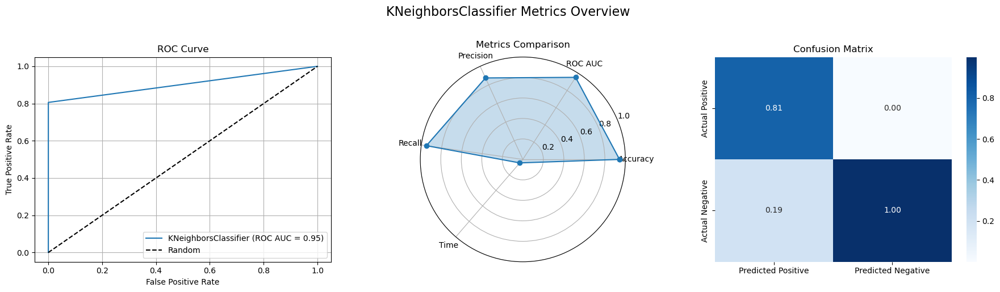

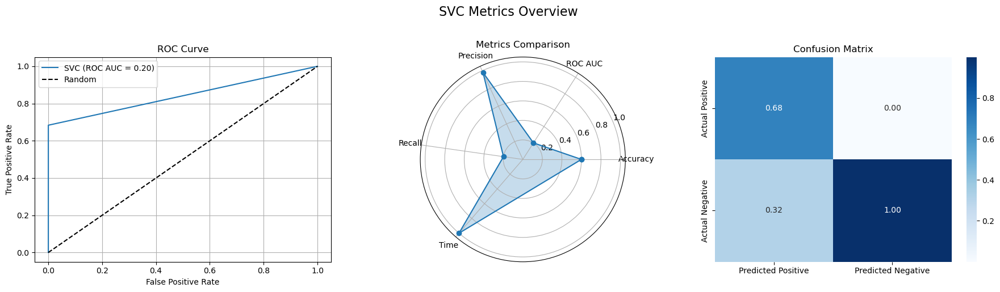

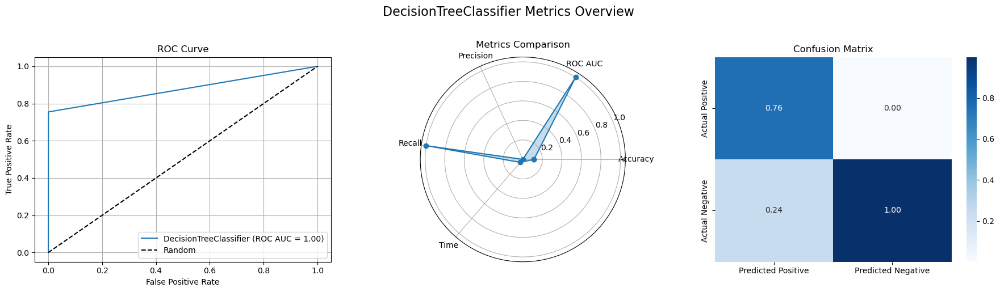

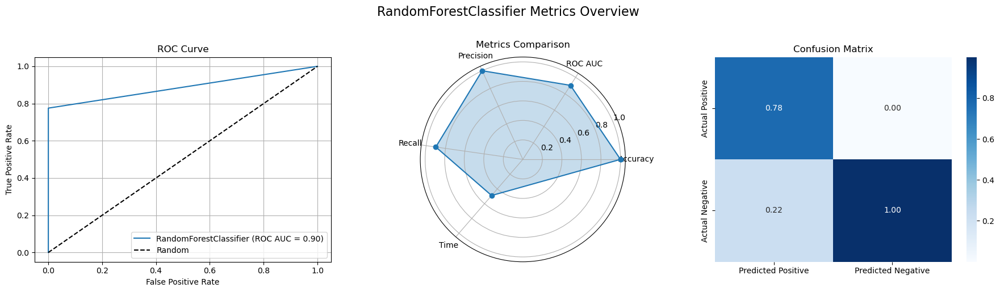

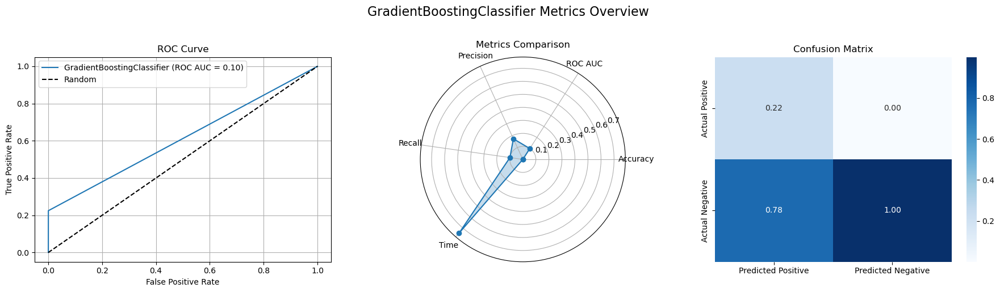

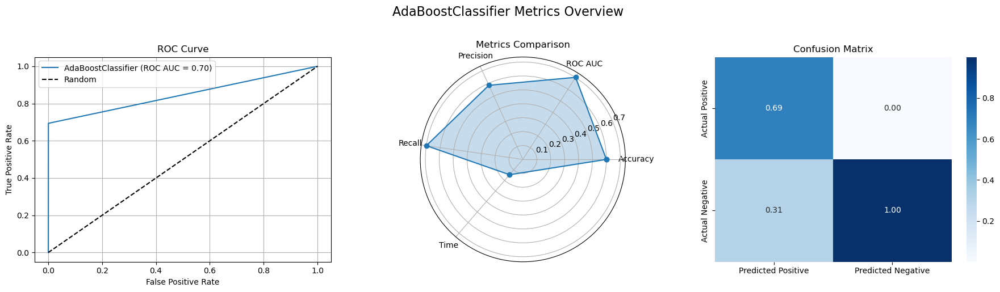

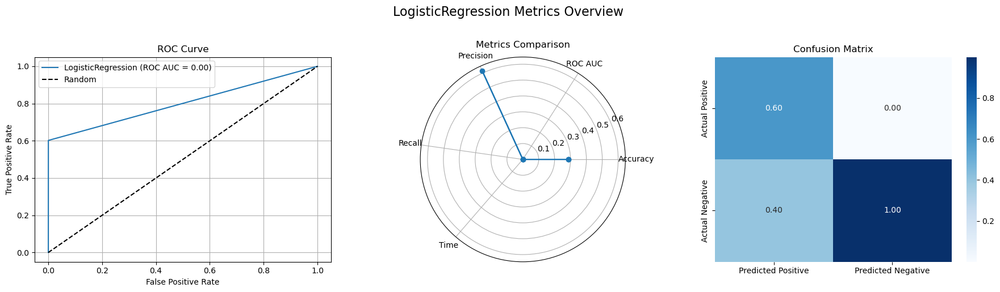

In [ ]:
plot_metrics(normalized_model_metrics_df_reduced)

Runtime_text = f'<h3><font color="#22116BF0"><b><center> The total runtime for experiment is: {total_time_reduced} minutes. </center><br></b></h3></font>'
display(HTML(Runtime_text))

#### <center> Outcomes: KNN classifier had highest recall of 0.80 and 0.90 ROCE post reduction of data thus it can be considered best model for second case </center>

<h2><font color="#0A4E97"><b>7. Conclusions and findings of Dataset 1<br></b></h2></font>

In [ ]:
metrics = ['Time', 'ROC AUC', 'Recall']

# Create separate dataframes for each metric
time_df = pd.DataFrame({
    'Model': model_metrics['Model'],
    'Original': model_metrics['Time'],
    'Reduced': model_metrics_reduced['Time']
})

roc_auc_df = pd.DataFrame({
    'Model': model_metrics['Model'],
    'Original': model_metrics['ROC AUC'],
    'Reduced': model_metrics_reduced['ROC AUC']
})

recall_df = pd.DataFrame({
    'Model': model_metrics['Model'],
    'Original': model_metrics['Recall'],
    'Reduced': model_metrics_reduced['Recall']
})

In [ ]:
def create_grouped_bar_chart(df, title):
    fig = px.bar(
        df,
        x='Model',
        y=['Original', 'Reduced'],
        barmode='group',
        title=title
    )
    
    # Update layout for better x-axis label rotation
    fig.update_layout(xaxis={'categoryorder': 'total ascending'})
    
    return fig

In [ ]:
# Create grouped bar charts for each dataframe
time_fig = create_grouped_bar_chart(time_df, 'Time Comparison (in milliseconds)')
roc_auc_fig = create_grouped_bar_chart(roc_auc_df, 'ROC AUC Comparison')
recall_fig = create_grouped_bar_chart(recall_df, 'Recall Comparison')

In [ ]:
time_fig.show()
roc_auc_fig.show()
recall_fig.show()

#### Variables Reduced:
* Total of 12 Variables were Reduced
* Univariate ROC analysis and Variance was used as measure to Reduce them 

#### Results
* Decision Tree Proved to be Best with all the metrices
* KNN was able to produce similar results with reduced dataset 

#### Time Gained
* 30% Time was saved in form of cost by reducing the Rows

<hr style="height:4px;border-width:0;color:#8EBAD9;background-color:#8EBAD9">  
<h1><font color="#0A4E97"><b><center> Dataset 2: Online Payments Fraud Detection Dataset </center><br></b></h1></font>

### Datset Overview:

* **step**: represents a unit of time where 1 step equals 1 hour
* **type**: type of online transaction
* **amount**: the amount of the transaction
* **nameOrig**: customer starting the transaction
* **oldbalanceOrg**: balance before the transaction
* **newbalanceOrig**: balance after the transaction
* **nameDest**: recipient of the transaction
* **oldbalanceDest**: initial balance of recipient before the transaction
* **newbalanceDest**: the new balance of recipient after the transaction
* **isFraud**: fraud transaction

In [ ]:
df = pd.read_csv(r"C:\Users\krtej\Jupyter_folder\Fraud\Dataset\Online_payment_fraud_detection_dataset\PS_20174392719_1491204439457_log.csv")

In [ ]:
df = df.drop(['nameOrig','isFlaggedFraud','nameDest'], axis = 1) 
df                                                               ### dropped unnecessary columns (Names, and predicted fraud )

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
0,1,PAYMENT,9839.64,170136.00,160296.36,0.00,0.00,0
1,1,PAYMENT,1864.28,21249.00,19384.72,0.00,0.00,0
2,1,TRANSFER,181.00,181.00,0.00,0.00,0.00,1
3,1,CASH_OUT,181.00,181.00,0.00,21182.00,0.00,1
4,1,PAYMENT,11668.14,41554.00,29885.86,0.00,0.00,0
...,...,...,...,...,...,...,...,...
6362615,743,CASH_OUT,339682.13,339682.13,0.00,0.00,339682.13,1
6362616,743,TRANSFER,6311409.28,6311409.28,0.00,0.00,0.00,1
6362617,743,CASH_OUT,6311409.28,6311409.28,0.00,68488.84,6379898.11,1
6362618,743,TRANSFER,850002.52,850002.52,0.00,0.00,0.00,1


<h2><font color="#0A4E97"><b>1. Exploratory Data Analysis <br></b></h2></font>

<h3><font color="#0A4E97"><b>Null Values and Data types <br></b></h3></font>

In [ ]:
df.isna().sum()

step              0
type              0
amount            0
oldbalanceOrg     0
newbalanceOrig    0
oldbalanceDest    0
newbalanceDest    0
isFraud           0
dtype: int64

##### No null values in the Dataset

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362620 entries, 0 to 6362619
Data columns (total 8 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   oldbalanceOrg   float64
 4   newbalanceOrig  float64
 5   oldbalanceDest  float64
 6   newbalanceDest  float64
 7   isFraud         int64  
dtypes: float64(5), int64(2), object(1)
memory usage: 388.3+ MB


In [ ]:
df.columns

Index(['step', 'type', 'amount', 'oldbalanceOrg', 'newbalanceOrig',
       'oldbalanceDest', 'newbalanceDest', 'isFraud'],
      dtype='object')

<h3><font color="#0A4E97"><b>Descriptive Analytics <br></b></h3></font>

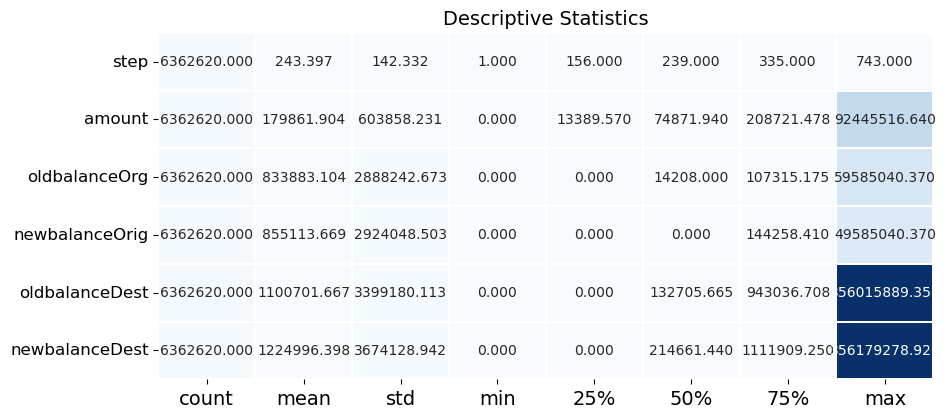

In [ ]:
cols2 = df[['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig','oldbalanceDest', 'newbalanceDest']]
desc_stats(cols2)

In [ ]:
# distribution of transaction type
type1 = df.type.value_counts()

In [ ]:
type1

CASH_OUT    2237500
PAYMENT     2151495
CASH_IN     1399284
TRANSFER     532909
DEBIT         41432
Name: type, dtype: int64

In [18]:
# figure = px.pie(data,
#                values = type1.values,
#                names = type1.index,
#                hole = .5,
#                title = 'Distribution of Transaction Type')
# figure.show()


<h3><font color="#0A4E97"><b>Correlation <br></b></h3></font>

In [ ]:
# correlation matrix
dfn = df.drop('isFraud', axis = 1)
corr = dfn.corr()
corr.style.background_gradient(cmap='GnBu')

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest
step,1.000000,0.022373,-0.010058,-0.010299,0.027665,0.025888
amount,0.022373,1.000000,-0.002762,-0.007861,0.294137,0.459304
oldbalanceOrg,-0.010058,-0.002762,1.000000,0.998803,0.066243,0.042029
newbalanceOrig,-0.010299,-0.007861,0.998803,1.000000,0.067812,0.041837
oldbalanceDest,0.027665,0.294137,0.066243,0.067812,1.000000,0.976569
newbalanceDest,0.025888,0.459304,0.042029,0.041837,0.976569,1.000000


#### NOTE : oldbalanceDest, newbalanceDest, NewbalanceOrig and OldbalanceOrig have very high correlation thus they will be combined to make two Feature since they represent balance before and after the transaction as origination and destination(recipient)

<h3><font color="#0A4E97"><b>Class Imbalance <br></b></h3></font>

In [21]:
# # Distribution of Fraud and Normal Transactions

# px.pie(df, names="isFraud", title="Distribution of Fraud and Normal Transactions:(Normal:0 | Fraud:1)", color_discrete_sequence=['#1E90FF', '#FF4500'],
#        template="plotly_dark", width=800, height=600)

<h3><font color="#0A4E97"><b>Understanding the nature of Fraud <br></b></h3></font>

In [ ]:
cross_tab_result=pd.crosstab(index=df.type,columns=df.isFraud)
cross_tab_result

isFraud,0,1
type,,
CASH_IN,1399284,0
CASH_OUT,2233384,4116
DEBIT,41432,0
PAYMENT,2151495,0
TRANSFER,528812,4097


#### As expected Frauds have happened during cash_out, Transfer type of transaction 

<h2><font color="#0A4E97"><b>2. PCA <br></b></h2></font>

### N-D to 2-D

In [ ]:
label_encoder = LabelEncoder()

# Fit and transform the 'type' column
df['type'] = label_encoder.fit_transform(df['type'])

In [ ]:
X = df.drop('isFraud', axis=1)

# Apply PCA with n_components=2
pca = PCA(n_components=2)
principal_components_2d = pca.fit_transform(X)

# Create a DataFrame for 2D principal components
pca_df_2d = pd.DataFrame(data=principal_components_2d, columns=['PC1', 'PC2'])

# Add the 'Class' column back to the DataFrame
pca_df_2d['isFraud'] = df['isFraud']

In [23]:
# sns.set(style='whitegrid')

# # Create a scatter plot using sns
# plt.figure(figsize=(10, 6))
# sns.scatterplot(data=pca_df_2d, x='PC1', y='PC2', hue='isFraud', palette='Set1')
# plt.title('PCA 2D Visualization')
# plt.show()

In [ ]:
loadings = pca.components_
# Create a DataFrame to show the loadings for each original variable on each principal component
loadings_df = pd.DataFrame(loadings, columns=X.columns, index=['PC1', 'PC2'])

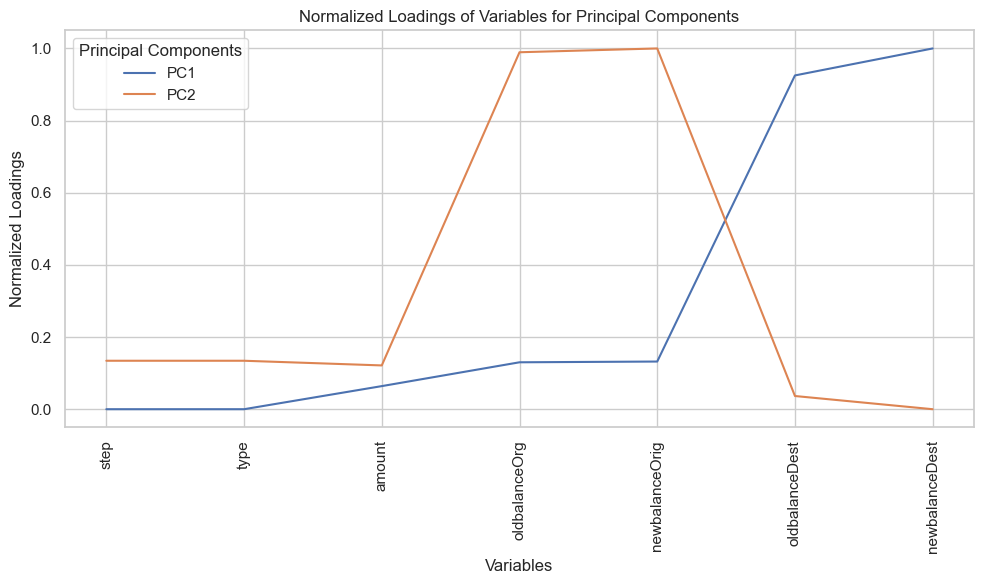

In [ ]:
# Normalize the loadings
scaler = MinMaxScaler()
normalized_loadings = scaler.fit_transform(loadings_df.T)

# Create a DataFrame for normalized loadings
normalized_loadings_df = pd.DataFrame(normalized_loadings, columns=loadings_df.index, index=loadings_df.columns)

# Plot normalized loadings using a line plot
plt.figure(figsize=(10, 6))
for pc in normalized_loadings_df.columns:
    plt.plot(normalized_loadings_df.index, normalized_loadings_df[pc], label=pc)

plt.title('Normalized Loadings of Variables for Principal Components')
plt.xlabel('Variables')
plt.ylabel('Normalized Loadings')
plt.legend(title='Principal Components')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<h2><font color="#0A4E97"><b>3. Normality Test using Shapiro - Wilk Test <br></b></h2></font>

In [22]:
# # Create a new DataFrame to store the normality test results
# normality_test_results = pd.DataFrame(columns=['Column', 'p-value'])

# # Create subplots
# num_columns = len(df.columns) - 1  # Exclude the last column
# num_rows = int(np.ceil(num_columns / 3))
# fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
# fig.tight_layout()

# # Loop through each column and perform Shapiro-Wilk test
# for i, column in enumerate(df.columns[:-1]):  # Exclude the last column
#     variable = df[column]
#     statistic, p_value = shapiro(variable)
#     normality_test_results = normality_test_results.append({'Column': column, 'p-value': p_value}, ignore_index=True)
    
#     # Create a distribution plot
#     ax = axes[i // 3, i % 3]
#     sns.histplot(variable, ax=ax, kde=True)
#     ax.set_title(f'Distribution of {column}')
    
#     # Highlight normal distributions
#     if p_value >= 0.05:
#         ax.text(0.95, 0.95, 'Normal', transform=ax.transAxes, fontsize=10,
#                 verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='green', alpha=0.5))
#     else:
#         ax.text(0.95, 0.95, 'Not Normal', transform=ax.transAxes, fontsize=10,
#                 verticalalignment='top', horizontalalignment='right', bbox=dict(facecolor='red', alpha=0.5))

# # Remove empty subplots
# if num_columns % 3 != 0:
#     for i in range(num_columns % 3, 3):
#         fig.delaxes(axes[num_rows - 1, i])

# # Show the plots
# plt.show()

<h2><font color="#0A4E97"><b>4. Feature Reduction <br></b></h2></font>

In [ ]:
columns_for_pca = ['newbalanceOrig', 'oldbalanceOrg', 'newbalanceDest', 'oldbalanceDest']

# Define the number of components to keep in PCA
n_components = 2

# Define the chunk size for sharding
chunk_size = 10000  # Adjust this based on your system's memory capacity

# Initialize an empty DataFrame to store PCA results
pca_results = pd.DataFrame()

# Iterate through chunks of the dataframe
for i in range(0, len(df), chunk_size):
    chunk = df.loc[i:i+chunk_size-1, :]

    # Create a DataFrame with the selected columns
    data_for_pca = chunk[columns_for_pca]

    # Standardize the data (mean = 0, variance = 1)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data_for_pca)

    # Create a PCA model and fit it to the scaled data
    pca = PCA(n_components=n_components)
    pca_components = pca.fit_transform(scaled_data)
    
    # Append PCA results to the pca_results DataFrame
    pca_results = pca_results.append(pd.DataFrame(pca_components, columns=[f'PCA_Component{i+1}' for i in range(n_components)]))

# Reset the index of pca_results
pca_results.reset_index(drop=True, inplace=True)

# Concatenate the PCA results with the original DataFrame
df_reduced = pd.concat([df, pca_results], axis=1)

# Drop the original columns if needed
df_reduced.drop(columns_for_pca, axis=1, inplace=True)

In [ ]:
X = df.drop(['isFraud','step', 'type','amount' ], axis=1)
loadings = pca.components_
# Create a DataFrame to show the loadings for each original variable on each principal component
loadings_df = pd.DataFrame(loadings, columns=X.columns, index=[f'PCA_Component{i+1}' for i in range(n_components)])

In [ ]:
loadings_df

,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest
PCA_Component1,0.057786,0.080251,0.705134,0.702144
PCA_Component2,0.704451,0.702754,-0.055683,-0.082377


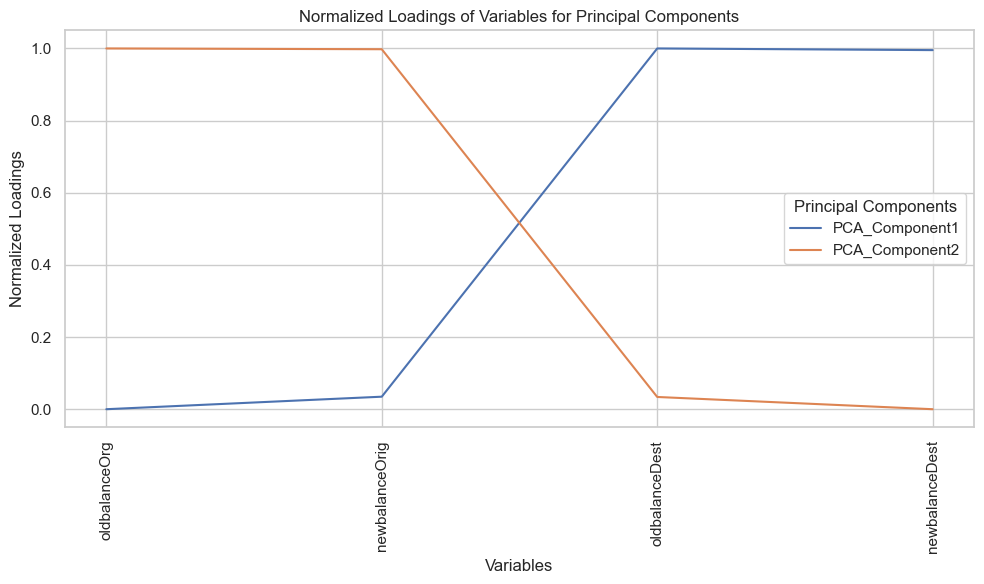

In [ ]:
# Normalize the loadings
scaler = MinMaxScaler()
normalized_loadings = scaler.fit_transform(loadings_df.T)

# Create a DataFrame for normalized loadings
normalized_loadings_df = pd.DataFrame(normalized_loadings, columns=loadings_df.index, index=loadings_df.columns)

# Plot normalized loadings using a line plot
plt.figure(figsize=(10, 6))
for pc in normalized_loadings_df.columns:
    plt.plot(normalized_loadings_df.index, normalized_loadings_df[pc], label=pc)

plt.title('Normalized Loadings of Variables for Principal Components')
plt.xlabel('Variables')
plt.ylabel('Normalized Loadings')
plt.legend(title='Principal Components')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

##### The newly created PCAs give weightage to PC1: Originator balanvces and PC2: Recipient Balances

In [ ]:
def plot_roc_curves_subplots(data, target_column):
    # Calculate ROC scores using the calculate_roc_scores function
    roc_scores_df = calculate_roc_scores(data, target_column)

    # Create a 5x5 grid of subplots
    fig, axes = plt.subplots(5, 1, figsize=(5, 25))

    # Iterate over each feature and subplot
    for i, (feature, ax) in enumerate(zip(roc_scores_df.index, axes)):
        X_feature = data[[feature]]
        y = data[target_column]
        X_train, X_test, y_train, y_test = train_test_split(X_feature, y, test_size=0.2, random_state=42)
        clf = LogisticRegression()
        clf.fit(X_train, y_train)
        y_pred_prob = clf.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
        roc_score = auc(fpr, tpr)

        ax.plot(fpr, tpr, label=f'AUC = {roc_score:.2f}')
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title(f'ROC Curve for {feature}')
        ax.legend(loc='lower right')

    # Adjust layout and show the subplots
    plt.tight_layout()
    plt.show()

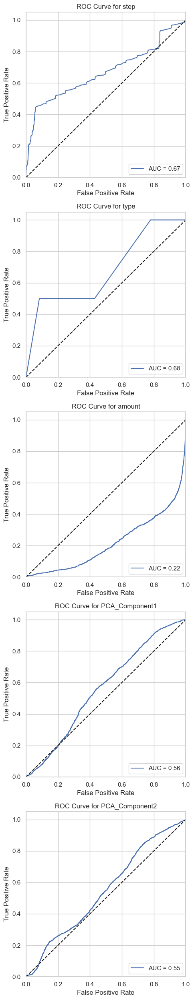

In [ ]:
plot_roc_curves_subplots(df_reduced, target_column='isFraud')

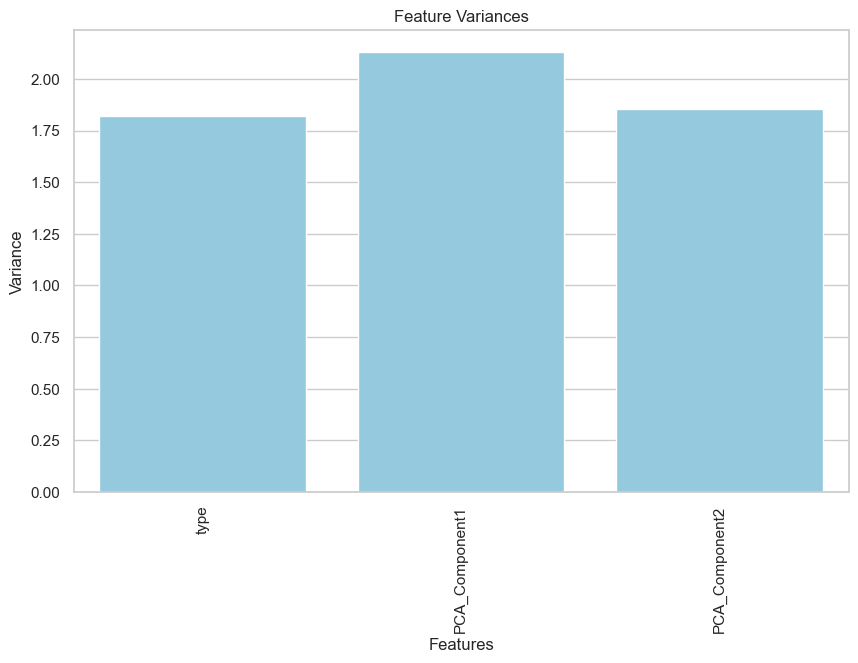

In [ ]:
features = df_reduced.drop(['isFraud', 'amount', 'step'], axis=1) 

# Calculate the variances of the normalized data
variances = features.var()

# Create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=variances.index, y=variances.values, color='skyblue')
plt.xticks(rotation=90)
plt.title('Feature Variances')
plt.xlabel('Features')
plt.ylabel('Variance')
plt.show()

#### Due to lack of any significant evidence no more columns will be reduced

<h2><font color="#0A4E97"><b>5. Model Implementation<br></b></h2></font>

<h3><font color="#0A4E97"><b>Orignal Dataset<br></b></h3></font>

#### Train Test Split 

In [ ]:
X=df.drop(["isFraud"],axis=1)
y=df["isFraud"]

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#### Standardisation of Data

In [ ]:
sc=StandardScaler()

X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

#### Model Implementation

In [ ]:
models = [knn, dtc, rfc, lr]

In [ ]:
model_metrics = evaluate_models(models, X_train, y_train, X_test, y_test)

In [ ]:
model_metrics

,Model,Accuracy,ROC AUC,Precision,Recall,Time,FPR,TPR,FNR,FPR_AUC,TNR,TPR_AUC
0,KNeighborsClassifier,0.999517,0.824673,0.957234,0.649383,25743.436766,0.000037,0.649383,0.350617,"[0.0, 3.698155014068726e-05, 1.0]",0.999963,"[0.0, 0.6493827160493827, 1.0]"
1,DecisionTreeClassifier,0.999726,0.940062,0.901961,0.880247,5805.435419,0.000122,0.880247,0.119753,"[0.0, 0.00012196043131503245, 1.0]",0.999878,"[0.0, 0.8802469135802469, 1.0]"
2,RandomForestClassifier,0.999726,0.899990,0.981075,0.800000,129785.284519,0.000020,0.800000,0.200000,"[0.0, 1.9671037308876202e-05, 1.0]",0.999980,"[0.0, 0.8, 1.0]"
3,LogisticRegression,0.999200,0.708921,0.900266,0.417901,1083.107448,0.000059,0.417901,0.582099,"[0.0, 5.90131119266286e-05, 1.0]",0.999941,"[0.0, 0.41790123456790124, 1.0]"


In [ ]:
total_time =( model_metrics['Time'].sum())/6000
total_time = round(total_time, 2)

In [ ]:
# Normalize metrics for better comparison
metrics_to_normalize = ['Accuracy', 'ROC AUC', 'Precision', 'Recall', 'Time']
normalized_model_metrics_df = model_metrics.copy()
normalized_model_metrics_df[metrics_to_normalize] = normalized_model_metrics_df[metrics_to_normalize].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

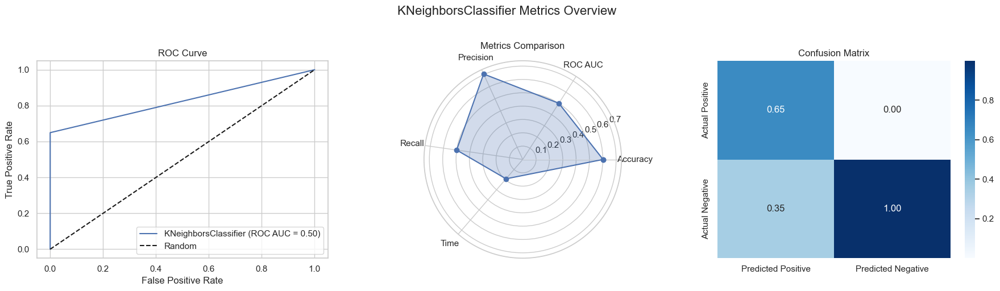

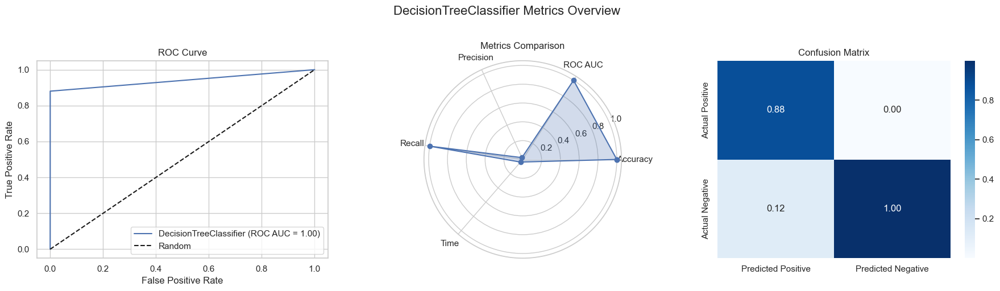

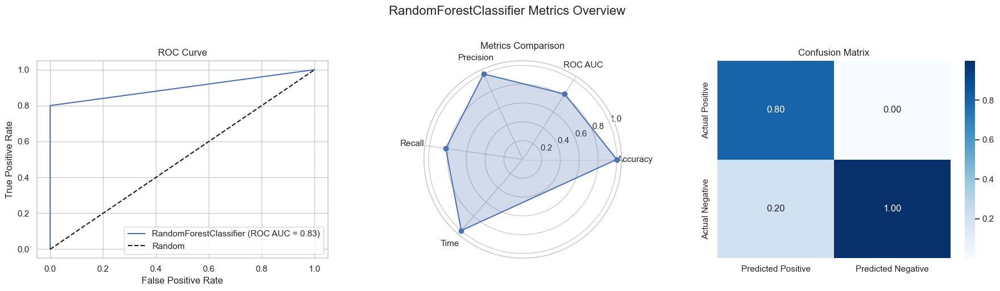

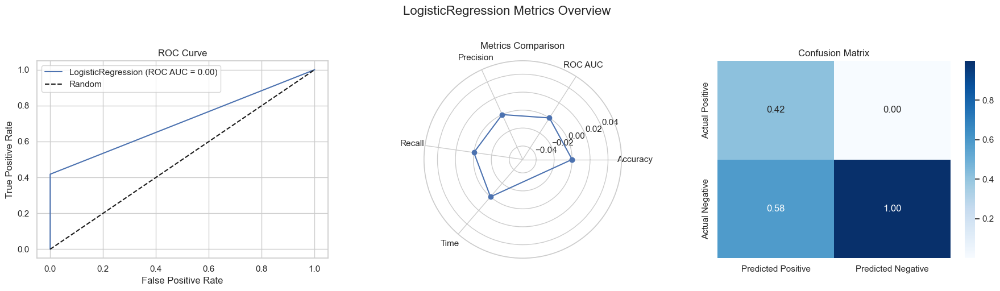

In [ ]:
plot_metrics(normalized_model_metrics_df)

Runtime_text = f'<h3><font color="#22116BF0"><b><center> The total runtime for experiment is: {total_time} minutes. </center><br></b></h3></font>'
display(HTML(Runtime_text))

##### <center> Descision Tree Classifier came out to be the best model with Recall of 0.88 and AUC ROC 0.94 </center>

<h3><font color="#0A4E97"><b>Reduced Dataset<br></b></h3></font>

#### Train Test Split 

In [ ]:
X=df_reduced.drop(["isFraud"],axis=1)
y=df_reduced["isFraud"]

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

#### Standardisation of Data

In [ ]:
sc=StandardScaler()

X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

#### Model Implementation 

In [ ]:
model_metrics_reduced = evaluate_models(models, X_train, y_train, X_test, y_test)

In [ ]:
model_metrics_reduced

,Model,Accuracy,ROC AUC,Precision,Recall,Time,FPR,TPR,FNR,FPR_AUC,TNR,TPR_AUC
0,KNeighborsClassifier,0.999333,0.755533,0.935593,0.511111,12878.202200,0.000045,0.511111,0.488889,"[0.0, 4.484996506423774e-05, 1.0]",0.999955,"[0.0, 0.5111111111111111, 1.0]"
1,DecisionTreeClassifier,0.999153,0.831272,0.668742,0.662963,6148.045206,0.000419,0.662963,0.337037,"[0.0, 0.0004185996739328856, 1.0]",0.999581,"[0.0, 0.662962962962963, 1.0]"
2,RandomForestClassifier,0.999451,0.794432,0.967546,0.588889,209211.722898,0.000025,0.588889,0.411111,"[0.0, 2.5178927755361537e-05, 1.0]",0.999975,"[0.0, 0.5888888888888889, 1.0]"
3,LogisticRegression,0.998713,0.506158,0.344828,0.012346,620.986962,0.000030,0.012346,0.987654,"[0.0, 2.9899976709491825e-05, 1.0]",0.999970,"[0.0, 0.012345679012345678, 1.0]"


In [ ]:
total_time_reduced =( model_metrics_reduced['Time'].sum())/6000
total_time_reduced = round(total_time_reduced, 2)

In [ ]:
# Normalize metrics for better comparison
metrics_to_normalize = ['Accuracy', 'ROC AUC', 'Precision', 'Recall', 'Time']
normalized_model_metrics_df_reduced = model_metrics_reduced.copy()
normalized_model_metrics_df_reduced[metrics_to_normalize] = normalized_model_metrics_df[metrics_to_normalize].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

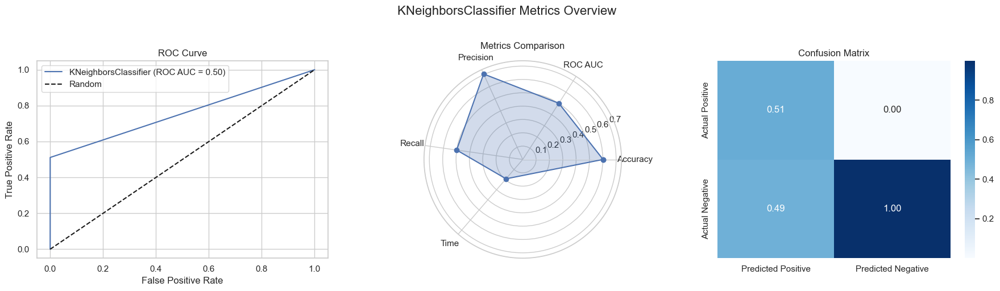

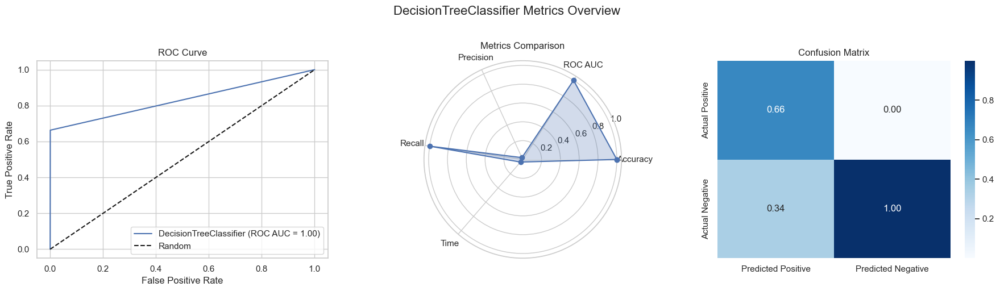

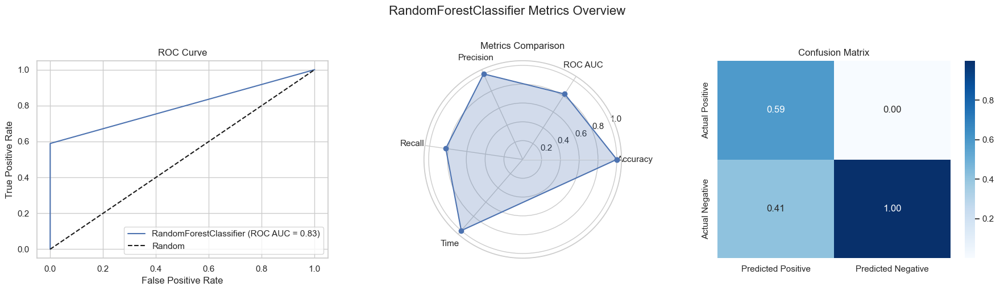

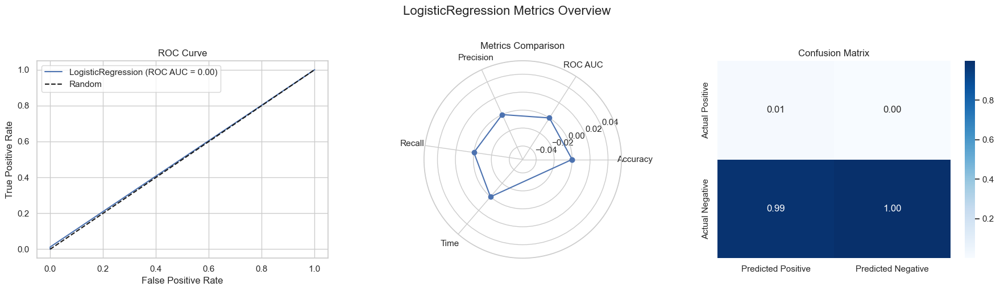

In [ ]:
plot_metrics(normalized_model_metrics_df_reduced)

Runtime_text = f'<h3><font color="#22116BF0"><b><center> The total runtime for experiment is: {total_time_reduced} minutes. </center><br></b></h3></font>'
display(HTML(Runtime_text))

<h2><font color="#0A4E97"><b>6. Conclusions and Findings - Dataset 2 <br></b></h2></font>

In [ ]:
metrics = ['Time', 'ROC AUC', 'Recall']

# Create separate dataframes for each metric
time_df = pd.DataFrame({
    'Model': model_metrics['Model'],
    'Original': model_metrics['Time'],
    'Reduced': model_metrics_reduced['Time']
})

roc_auc_df = pd.DataFrame({
    'Model': model_metrics['Model'],
    'Original': model_metrics['ROC AUC'],
    'Reduced': model_metrics_reduced['ROC AUC']
})

recall_df = pd.DataFrame({
    'Model': model_metrics['Model'],
    'Original': model_metrics['Recall'],
    'Reduced': model_metrics_reduced['Recall']
})

In [ ]:
def create_grouped_bar_chart(df, title):
    fig = px.bar(
        df,
        x='Model',
        y=['Original', 'Reduced'],
        barmode='group',
        title=title
    )
    
    # Update layout for better x-axis label rotation
    fig.update_layout(xaxis={'categoryorder': 'total ascending'})
    
    return fig

In [ ]:
# Create grouped bar charts for each dataframe
time_fig = create_grouped_bar_chart(time_df, 'Time Comparison (in milliseconds)')
roc_auc_fig = create_grouped_bar_chart(roc_auc_df, 'ROC AUC Comparison')
recall_fig = create_grouped_bar_chart(recall_df, 'Recall Comparison')

In [19]:
# time_fig.show()
# roc_auc_fig.show()
# recall_fig.show()

#### Variables Reduced:
* 4 Variables were convereted to 2
* Correlation matrix was used to determine high correlation between 4 variables and thosew were reduced using PCA 

#### Results
* Decision Tree Proved to be Best with all the metrices
* None of the model proved to be satisfactory by reducing the metrices

#### Time
* Despite reduction of features 40% additional time was used for prediction of models

<hr style="height:4px;border-width:0;color:#8EBAD9;background-color:#8EBAD9">  